In [1]:
import numpy as np
import scipy
import skfem    
#https://scikit-fem.readthedocs.io/en/latest/index.html

import matplotlib.pyplot as plt
#import importlib  # for reloading routines
%matplotlib inline


In [ ]:
# notes for future work:  basis.get_dofs().all('u') gives boundary indices
# basis.get_dofs().all('u_n') gives boundary normal indices
# these might be useful for setting Dirichlet like BC

The Swift-Hohenberg model is 
\begin{align}
\partial_t u = r u -  (1 + \Delta)^2 u + \gamma_u u^2 - u^3
\end{align}

The weak/variational form of the problem is 
\begin{align}
\int_\Omega \partial_t u\ w\ dx &= \int_\Omega ( (r-1) u - 2 \Delta u - \Delta^2 u  ) w \ dx + \int_\Omega g(u) \ w \ dx\\
\end{align}
with function $$g(u) = \gamma_u u^2- u^3$$  and test function $w \in \hat V$ where $\hat V$ is a Sobolev space  $H^2$. 
It will probably be easier to do the integration by parts with index notation. 
$\Delta = \sum_i \partial_{ii}$, $\Delta^2 = \sum_{ij} \partial_{iijj} $. 

We twice integrate by parts the term with $\Delta^2$. 
\begin{align}
\int_\Omega \Delta^2 u \ w dx &= \int_\Omega  \sum_{ij} (\partial_{iijj} u) w dx \\
& = -  \int_\Omega \sum_{ij} \partial_{ijj} u \partial_i w   \ dx 
+ \int_{\partial \Omega}\sum_{ij} (\partial_i \partial_{jj} u)\ w \ ds_i\\
 & = \int_\Omega \sum_{ij} \partial_{ij} u \partial_{ij} w \ dx
- \int_{\partial \Omega} \sum_{ij} (\partial_i w) (\partial_{ij} u) \ ds_j
  +  \int_{\partial \Omega} w(\nabla \Delta u)\ \cdot \ ds\\
\end{align}

If $\Delta^2 u=0$ and all components of $\partial_{ij} u = 0$ then the boundary terms are zero. 
Becaues our test functions $w \in H^2(\Omega)$  we need a fancy element. 
That means using the Morley or Argyris element. 

What do we do with the Laplacian term $\Delta u$? Ordinarily we would do this:
$$\int_{\Omega} \Delta u w dx = - \int_{\Omega} \nabla u \nabla w \ dx + \int_{\partial \Omega} \partial_n u w ds  $$
But this gives a boundary term that conflicts with our two boundary terms we have from the biharmonic term. 
So we don't do that.

Note that the boundary term 
\begin{align}
 - \int_{\partial \Omega} \sum_{ij} (\partial_i w) (\partial_{ij} u) \ ds_j
  = \int_{\partial \Omega} w \nabla \Delta u \cdot ds - \int_{\partial \partial \Omega} w \partial_{ij} u ds_{ij}
\end{align}

We use weak form 
\begin{align}
\int_\Omega \partial_t u\ w\ dx 
 & =  \int_\Omega  ((1-r)u - 2 \Delta u) w \ dx 
 - \int_\Omega \sum_{ij} \partial_{ij} u \partial_{ij} w \ dx
  -  2\int_{\partial \Omega} (\nabla \Delta u)\ w \ ds + \int_\Omega g(u) \ w \ dx
\end{align}

There is an extra boundary of boundary term which we dropped. 

We can operator split with 
$L = (r-1) - 2\Delta - \Delta^2$ and function $g(u)$. 

The zero Neumann like boundary condition is $\frac{\partial}{\partial n} \Delta u = 0$ and probably there is a 
condition on $\Delta u$ also. 

We discretise the problem using the non-conforming Morley finite element <https://users.aalto.fi/~jakke74/WebFiles/Slides-Niiranen-ADMOS-09.pdf> which is a piecewise quadratic $C^0$-continuous element for biharmonic problems. The basis is apparently $H^2$ 
which is L2 functions (integrated over the domain) of the function, gradient and second order derivatives. 
The elements contain information about the gradients on the edges of the elements.
We also had success with 5th order Argyris elements. 

In [19]:
from scipy.sparse.linalg import splu  # for sparse matrices, 
# returns something like invA with LU decomp which can be applied with solve to solve Ax = b for x

from skfem.models.poisson import mass
from skfem.visuals.matplotlib import plot
from skfem import BilinearForm

# display,  calls skfem's plot routine 
def disp(mesh,u,basis,t):
    fig,ax = plt.subplots(1,1,figsize=(4,3),sharex=True,sharey=True,dpi=150)
    plt.subplots_adjust(left=0.1,right=0.98,bottom=0.1,top=0.99)
    ax.set_aspect('equal'); 
    u_mag = u[basis.nodal_dofs.flatten()]  
    ax_j0 = plot(mesh, u_mag, shading='gouraud', ax = ax)
    #fig = ax.get_figure()
    field0 = ax.get_children()[0]  # vertex-based temperature-colour
    fig.colorbar(field0,shrink=0.8)
    title = ax.set_title(f'$t$ = {t:.3f}')
    return fig,ax

def mkpngs(froot, i, mesh,u,basis,t):
    fig,axarr = disp(mesh,u,basis,t)
    istr = '{:d}'.format(i)
    if (i <10):
        istr = '0' + istr 
    if (i <100):
        istr = '0' + istr 
    fname = froot + '_' + istr + '.png'
    print(fname)
    fig.savefig(fname)
    plt.close(fig)


In [5]:

mcircs= skfem.MeshTri.init_circle(6,smoothed=False)  # make a triangular mesh of the unit circle, the number is refinement level
rmax = 25.
#mcirc = skfem.MeshTri(mcircs.p*rmax,mcircs.t)  # expand the mesh to be larger 
mcirc = mcircs.translated(rmax * mcircs.p) # expand the mesh to be larger 
# now it is a circle of radius rmax
mcirc # show the mesh
#plt.plot(mcirc.p[0],mcirc.p[1],'.')  # plot points in the mesh

In [14]:
# make the basis
element = skfem.ElementTriMorley()  #  we need a fancy Morley element for biharmonic problems. 
basis = skfem.Basis(mcirc, element)  # could add intorder=?
D=basis.get_dofs() # automatically find boundary, just in case you want to experiment with it
#bdofs = basis.get_dofs(lambda x: np.sqrt(x[0]**2 + x[1]**2) > rmax - epsilon), this also would have worked 
# d_basis = skfem.FacetBasis(D,element) 

In [16]:
r=0.2 # control parameter is needed in the bilinear form 
gammau = 0.0  # for g(u)
dt = 0.05  # for making operators

@BilinearForm  # for info on forms see https://scikit-fem.readthedocs.io/en/latest/advanced.html#forms
def bilinf(u, v, w):  # The last argument w is a dictionary thing associated with the fields and elements 
    from skfem.helpers import ddot, trace  #  f3 equivalent to  ddot(C(dd(u)), dd(v)).  dot,   grad,dd, 
    f3 = -1*ddot(u.hess, v.hess)   # ddot of hessians is  \sum_{ij} \partial_{ij} u \partial_{ij} v 
    #equivalent to np.einsum('ij,ij', u.hess, v.hess)
    #f2 = +2*dot(grad(u), grad(v))  # this was 2*laplacian conventionally and is a bad idea 
    f2 = -2*trace(u.hess)*v  # this is -2 times the laplacian
    f1 = (r-1.)*u*v   
    return (f1+f2+f3)

# the extra function:
def g(u,gammau):
    return gammau*u**2 -(u**3)

# assemple the operators with the basis!
M = skfem.asm(mass, basis)  # mass matrix is a bilinear form of u,v returning u*v
L = skfem.asm(bilinf, basis)

#L0, M0 = skfem.penalize(L, M, D=D)  # boundary condition used here for u = 0, du/dn = 0 boundary  
#L0, M0 = skfem.enforce(L,  M, D=D);
L0, M0 = L, M  # Neumann like BC (natural ones involved doing nothing)
theta = 0.5         # Crank–Nicolson algorithm for a diffusion PDE
A = M0 - theta * L0 * dt   # not flipping sign of bilinear form here, conventional signs for CN method  
B = M0 + (1. - theta) * L0 * dt

backsolve = splu(A.T).solve  # .T as splu prefers CSC which is a sparse matrix format (compressed sparse column)
# is like A inverse but is applied with solve 

In [18]:
# op split integrator, crank nicholson for the diffusion and biharmonic parts and simply adding in the 
# non-linear function terms by hand afterwards 
# do a single timestep, return u field and time 
# requires globals: dt, backsolve,  B
# note r,dt is used in definition of B and backsolve 
def one_step(t,u,gammau):
    t += dt
    u = backsolve(B @ u)    # no .T here!
    u += g(u,gammau)*dt
    return t,u


(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 0.000'}>)

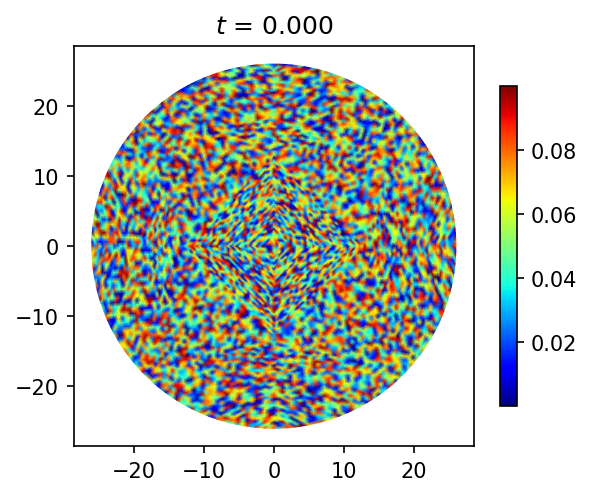

In [26]:
# make random initial conditions for u field
nnodes = len(basis.doflocs[0])
u_init = np.zeros(nnodes)
r2nodes = np.sqrt(basis.doflocs[0,:]**2 +  basis.doflocs[1,:]**2)
for i in range(nnodes):
    if (r2nodes[i] <1.3*rmax):
        u_init[i] = 1e-1*np.random.uniform(low=0,high=1)  # if you want to only set nodes in the center 
# show initial conditions 
t=0
disp(mcirc,u_init,basis,t)  #display initial conditions 

(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 0.050'}>)

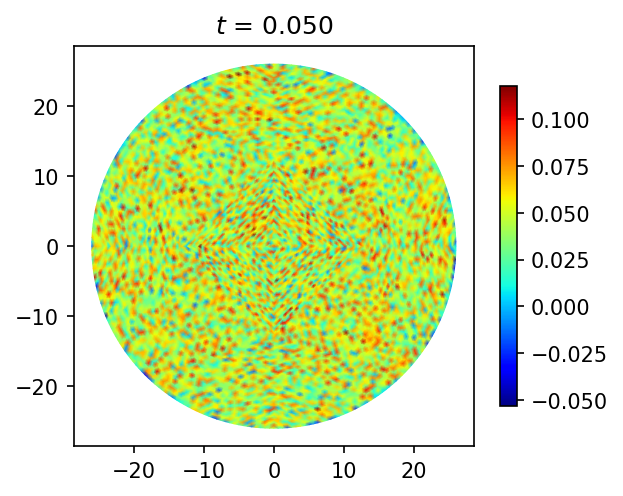

In [22]:
u = np.copy(u_init);  t=0; 
for i in range(1):
    t, u = one_step(t,u,gammau)  
disp(mcirc,u,basis,t)

(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 50.050'}>)

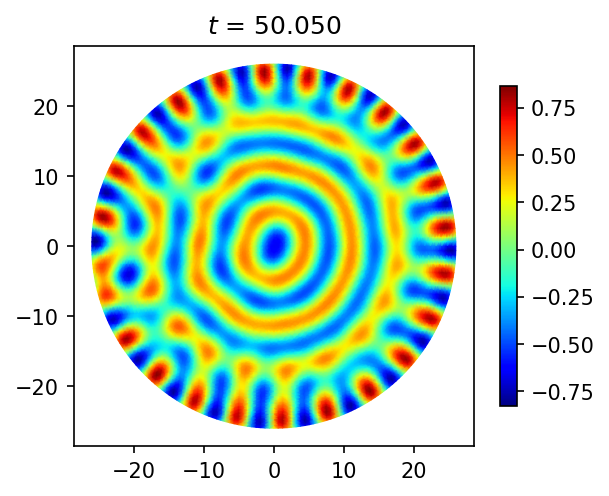

In [24]:
for i in range(1000):
    t, u = one_step(t,u,gammau)  
disp(mcirc,u,basis,t)

In [47]:
u = np.copy(u_init);  t=0; 
nmax = 1000
dn = int(nmax/50)
dd = int(nmax/dn)
froot = 'SH_a'
for i in range(dd):
    for j in range(dn):
        t, u = one_step(t, u,gammau)  
    mkpngs(froot, i, mcirc,u,basis,t)

SH_a_000.png
SH_a_001.png
SH_a_002.png
SH_a_003.png
SH_a_004.png
SH_a_005.png
SH_a_006.png
SH_a_007.png
SH_a_008.png
SH_a_009.png
SH_a_010.png
SH_a_011.png
SH_a_012.png
SH_a_013.png
SH_a_014.png
SH_a_015.png
SH_a_016.png
SH_a_017.png
SH_a_018.png
SH_a_019.png
SH_a_020.png
SH_a_021.png
SH_a_022.png
SH_a_023.png
SH_a_024.png
SH_a_025.png
SH_a_026.png
SH_a_027.png
SH_a_028.png
SH_a_029.png
SH_a_030.png
SH_a_031.png
SH_a_032.png
SH_a_033.png
SH_a_034.png
SH_a_035.png
SH_a_036.png
SH_a_037.png
SH_a_038.png
SH_a_039.png
SH_a_040.png
SH_a_041.png
SH_a_042.png
SH_a_043.png
SH_a_044.png
SH_a_045.png
SH_a_046.png
SH_a_047.png
SH_a_048.png
SH_a_049.png


In [ ]:
# not too bad! looks ok!

In [50]:
# trying a different set of parameters 
r=0.2 # control parameter is needed in the bilinear form 
gammau = 1.0  # for g(u)
dt = 0.05  # for making operators

@BilinearForm
def bilinf(u, v, w):
    from skfem.helpers import  dot, grad, ddot, dd, trace  #  f3 equivalent to  ddot(C(dd(u)), dd(v))
    f3 = -1*ddot(u.hess, v.hess)   # ddot of hessians is  \sum_{ij} \partial_{ij} u \partial_{ij} v 
    #equivalent to np.einsum('ij,ij', u.hess, v.hess)
    #f2 = +2*dot(grad(u), grad(v))  # this was 2*laplacian conventionally and is a bad idea 
    f2 = -2*trace(u.hess)*v  # this is 2 times the laplacian
    f1 = (r-1.)*u*v   
    return (f1+f2+f3)

# the extra function:
def g(u,gammau):
    return gammau*u**2 -(u**3)

# assemple the operators with the basis!
M = skfem.asm(mass, basis)  # mass matrix is a bilinear form of u,v returning u*v
L = skfem.asm(bilinf, basis)

#L0, M0 = skfem.penalize(L, M, D=D)  # boundary condition used here for u = 0, du/dn = 0 boundary  
#L0, M0 = skfem.enforce(L,  M, D=D);
L0, M0 = L, M  # Neumann like BC (natural ones involved doing nothing)
theta = 0.5         # Crank–Nicolson algorithm for a diffusion PDE
A = M0 - theta * L0 * dt   #not flipping sign of bilinear form here 
B = M0 + (1. - theta) * L0 * dt

backsolve = splu(A.T).solve  # .T as splu prefers CSC which is a sparse matrix format (compressed sparse column)
# is like A inverse but is applied with solve 

(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 100.000'}>)

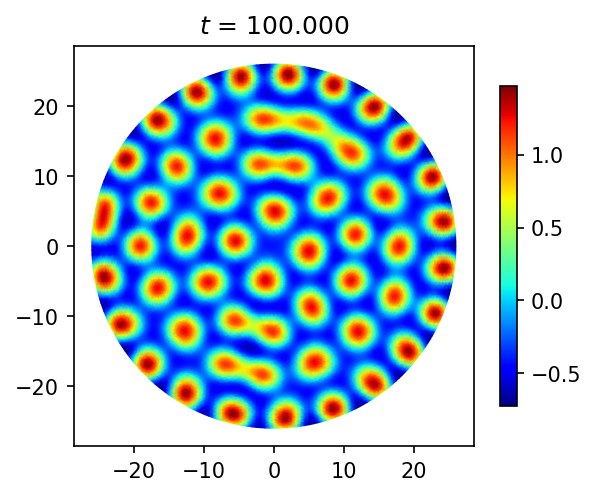

In [52]:
u = np.copy(u_init);  t=0; 
for i in range(2000):
    t, u = one_step(t,u,gammau)  
disp(mcirc,u,basis,t)

In [ ]:
# sweet!

In [54]:
u = u_init;  t=0; 
nmax = 1000
dn = int(nmax/50)
dd = int(nmax/dn)
froot = 'SH_b'
for i in range(dd):
    for j in range(dn):
        t, u = one_step(t, u,gammau)  
    mkpngs(froot, i, mcirc,u,basis,t)

SH_b_000.png
SH_b_001.png
SH_b_002.png
SH_b_003.png
SH_b_004.png
SH_b_005.png
SH_b_006.png
SH_b_007.png
SH_b_008.png
SH_b_009.png
SH_b_010.png
SH_b_011.png
SH_b_012.png
SH_b_013.png
SH_b_014.png
SH_b_015.png
SH_b_016.png
SH_b_017.png
SH_b_018.png
SH_b_019.png
SH_b_020.png
SH_b_021.png
SH_b_022.png
SH_b_023.png
SH_b_024.png
SH_b_025.png
SH_b_026.png
SH_b_027.png
SH_b_028.png
SH_b_029.png
SH_b_030.png
SH_b_031.png
SH_b_032.png
SH_b_033.png
SH_b_034.png
SH_b_035.png
SH_b_036.png
SH_b_037.png
SH_b_038.png
SH_b_039.png
SH_b_040.png
SH_b_041.png
SH_b_042.png
SH_b_043.png
SH_b_044.png
SH_b_045.png
SH_b_046.png
SH_b_047.png
SH_b_048.png
SH_b_049.png


with $r=0.1$ and g=0. we are supposed to get convection rolls .

https://www.chebfun.org/examples/pde/SwiftHohenberg.html 

with  $r=10^{−2}$ and $g=1$ we are supposed to get spots 


In [28]:
# trying a different set of parameters 
r=0.1 # control parameter is needed in the bilinear form 
gammau = 0.0  # for g(u)
dt = 0.05  # for making operators

@BilinearForm
def bilinf(u, v, w):
    from skfem.helpers import  dot, grad, ddot, dd, trace  #  f3 equivalent to  ddot(C(dd(u)), dd(v))
    f3 = -1*ddot(u.hess, v.hess)   # ddot of hessians is  \sum_{ij} \partial_{ij} u \partial_{ij} v 
    #equivalent to np.einsum('ij,ij', u.hess, v.hess)
    #f2 = +2*dot(grad(u), grad(v))  # this was 2*laplacian conventionally and is a bad idea 
    f2 = -2*trace(u.hess)*v  # this is 2 times the laplacian
    f1 = (r-1.)*u*v   
    return (f1+f2+f3)

# the extra function:
def g(u,gammau):
    return gammau*u**2 -(u**3)

# assemple the operators with the basis!
M = skfem.asm(mass, basis)  # mass matrix is a bilinear form of u,v returning u*v
L = skfem.asm(bilinf, basis)

#L0, M0 = skfem.penalize(L, M, D=D)  # boundary condition used here for u = 0, du/dn = 0 boundary  
#L0, M0 = skfem.enforce(L,  M, D=D);
L0, M0 = L, M  # Neumann like BC (natural ones involved doing nothing)
theta = 0.5         # Crank–Nicolson algorithm for a diffusion PDE
A = M0 - theta * L0 * dt   #not flipping sign of bilinear form here 
B = M0 + (1. - theta) * L0 * dt

backsolve = splu(A.T).solve  # .T as splu prefers CSC which is a sparse matrix format (compressed sparse column)
# is like A inverse but is applied with solve 

(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 100.000'}>)

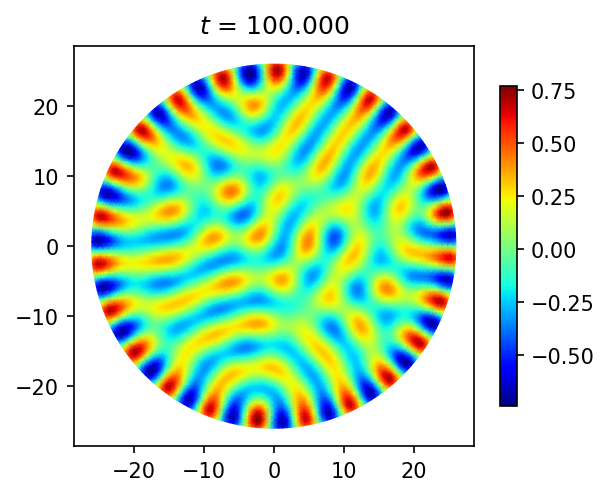

In [30]:
u = np.copy(u_init);  t=0; 
for i in range(2000):
    t, u = one_step(t,u,gammau)  
disp(mcirc,u,basis,t)

### clear influence of boundary on nature of pattern!

### why is adding in the non-linear term not interfereing with the boundary condition?

In [ ]:
# I tried using TriHermite elements , nojoy, could not display result with plot. I think plot does not work
# for fancy elements 
# Also creating basis froze (inf loop?) at 6 refinement level for the triangular mesh 

In [174]:
# display,  does not call skfem's plot routine , needed for other kinds of elements
def disp2(mesh,u,basis,t):
    fig,ax = plt.subplots(1,1,figsize=(4,3),sharex=True,sharey=True,dpi=150)
    plt.subplots_adjust(left=0.1,right=0.98,bottom=0.1,top=0.99)
    ax.set_aspect('equal'); 
    #u_mag = u[basis.nodal_dofs.flatten()]  
    #ax_j0 = plot(mesh, u_mag, shading='gouraud', ax = ax)
    plot(basis,u, shading='gouraud', ax = ax)
    #fig = ax.get_figure()
    #ax.tripcolor(basis.doflocs[0],basis.doflocs[1],u)
    field0 = ax.get_children()[0]  # vertex-based temperature-colour
    fig.colorbar(field0,shrink=0.8)
    title = ax.set_title(f'$t$ = {t:.3f}')
    return fig,ax

mcircs= skfem.MeshTri.init_circle(6,smoothed=False)  # make a triangular mesh of the unit circle, the number is refinement level
rmax = 25.
#mcirc = skfem.MeshTri(mcircs.p*rmax,mcircs.t)  # expand the mesh to be larger 
mcirc = mcircs.translated(rmax * mcircs.p) # expand the mesh to be larger 
# now it is a circle of radius rmax
mcirc # show the mesh
#plt.plot(mcirc.p[0],mcirc.p[1],'.')  # plot points in the mesh



In [140]:
# make the basis
element = skfem.ElementTriArgyris()  #  trying this!
basis = skfem.Basis(mcirc, element)  # 
D=basis.get_dofs() # automatically find boundary, just in case you want to experiment with it


(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 0.000'}>)

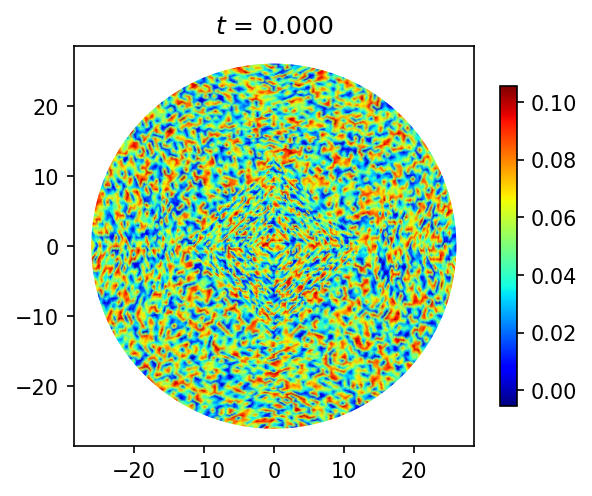

In [176]:
# make random initial conditions for u field
nnodes = len(basis.doflocs[0])
u_init = np.zeros(nnodes)
r2nodes = np.sqrt(basis.doflocs[0,:]**2 +  basis.doflocs[1,:]**2)
for i in range(nnodes):
    if (r2nodes[i] <1.3*rmax):
        u_init[i] = 1e-1*np.random.uniform(low=0,high=1)  # if you want to only set nodes in the center 
# show initial conditions 
t=0
#disp(mcirc,u_init,basis,t)  #display initial conditions  nojoy
disp2(mcirc,u_init,basis,t)

In [178]:
# trying a different set of parameters 
r=0.1 # control parameter is needed in the bilinear form 
gammau = 0.0  # for g(u)
dt = 0.05  # for making operators

@BilinearForm
def bilinf(u, v, w):
    from skfem.helpers import  dot, grad, ddot, dd, trace  #  f3 equivalent to  ddot(C(dd(u)), dd(v))
    f3 = -1*ddot(u.hess, v.hess)   # ddot of hessians is  \sum_{ij} \partial_{ij} u \partial_{ij} v 
    #equivalent to np.einsum('ij,ij', u.hess, v.hess)
    #f2 = +2*dot(grad(u), grad(v))  # this was 2*laplacian conventionally and is a bad idea 
    f2 = -2*trace(u.hess)*v  # this is 2 times the laplacian
    f1 = (r-1.)*u*v   
    return (f1+f2+f3)

# the extra function:
def g(u,gammau):
    return gammau*u**2 -(u**3)

# assemple the operators with the basis!
M = skfem.asm(mass, basis)  # mass matrix is a bilinear form of u,v returning u*v
L = skfem.asm(bilinf, basis)

#L0, M0 = skfem.penalize(L, M, D=D)  # boundary condition used here for u = 0, du/dn = 0 boundary  
#L0, M0 = skfem.enforce(L,  M, D=D);
L0, M0 = L, M  # Neumann like BC (natural ones involved doing nothing)
theta = 0.5         # Crank–Nicolson algorithm for a diffusion PDE
A = M0 - theta * L0 * dt   #not flipping sign of bilinear form here 
B = M0 + (1. - theta) * L0 * dt

backsolve = splu(A.T).solve  # .T as splu prefers CSC which is a sparse matrix format (compressed sparse column)
# is like A inverse but is applied with solve 

# op split integrator, crank nicholson for the diffusion and biharmonic parts and simply adding in the 
# non-linear function terms by hand afterwards 
# do a single timestep, return u field and time 
# requires globals: dt, backsolve,  B
# note r,dt is used in definition of B and backsolve 
def one_step(t,u,gammau):
    t += dt
    u = backsolve(B @ u)    # no .T here!
    u += g(u,gammau)*dt
    return t,u


(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 1.000'}>)

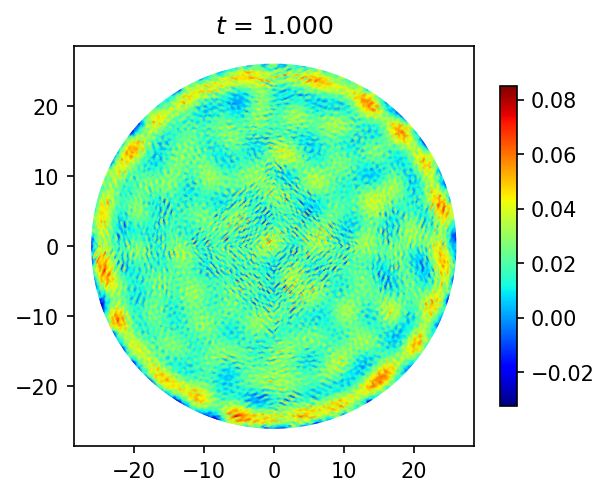

In [179]:
u = np.copy(u_init);  t=0; 
for i in range(20):
    t, u = one_step(t,u,gammau)  
disp2(mcirc,u,basis,t)

(<Figure size 600x450 with 2 Axes>, <Axes: title={'center': '$t$ = 51.000'}>)

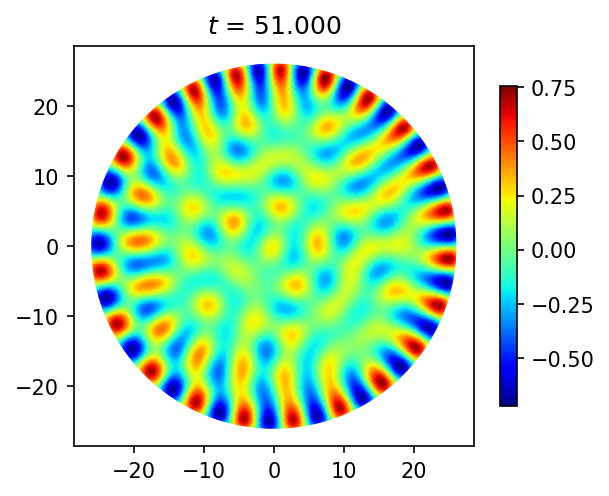

In [182]:
for i in range(1000):
    t, u = one_step(t,u,gammau)  
disp2(mcirc,u,basis,t)

In [ ]:
# joy! works on Argyris element! and seems much smoother! this took a few minutes to run
# This could probably work on a less refined mesh and get good results because Argyris is 5th order